<a href="https://colab.research.google.com/github/Kseniya74/Prof_activity_workshop/blob/main/CV_cat_or_rabbit.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Классификация изображений животных**

In [1]:
# Импорт необходимых для работы библиотек

import tensorflow as tf
from tensorflow import keras
import tensorflow_hub as hub
# Импорт библиотеки для разделения датасета на тренировочные и тестовые данные
from sklearn.model_selection import train_test_split

# Импорт библиотек для визуализации
import matplotlib.pyplot as plt
import PIL.Image as Image
import cv2

import os
import numpy as np
import pathlib
import pandas as pd

##**Подготовка данных**

In [2]:
#  Монтирование диска с датасетом

from google.colab import drive
drive.mount('/content/gdrive')

data_dir = "/content/gdrive/MyDrive/Практикум"
data_dir = pathlib.Path(data_dir)
data_dir

Mounted at /content/gdrive


PosixPath('/content/gdrive/MyDrive/Практикум')

###**Разделение на категории и проверка образцов**

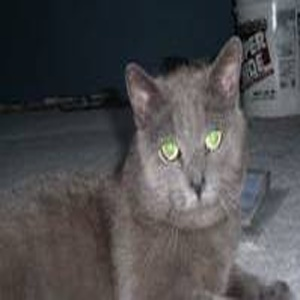

In [3]:
cats_train = list((data_dir / 'train-cat-rabbit' / 'cat').glob('*'))
Image.open(str(cats_train[13]))

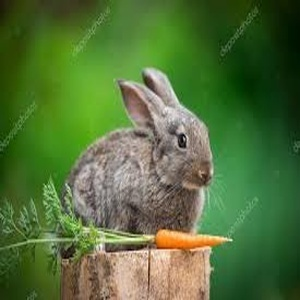

In [4]:
rabbits_train = list((data_dir / 'train-cat-rabbit' / 'rabbit').glob('*'))
Image.open(str(rabbits_train[96]))

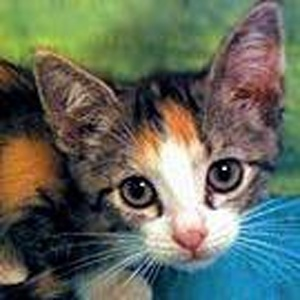

In [38]:
cats_val = list((data_dir / 'val-cat-rabbit' / 'cat').glob('*'))
Image.open(str(cats_val[13]))

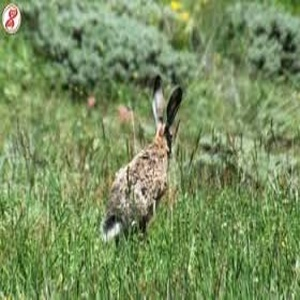

In [39]:
rabbits_val = list((data_dir / 'val-cat-rabbit' / 'rabbit').glob('*'))
Image.open(str(rabbits_val[13]))

###**Назначение отдельных словарей для изображений и соответствующих им меток**

In [7]:
# Словарь, хранящий путь к тестовым изображениям
df_images_train = {
    'cats' : cats_train,
    'rabbits' : rabbits_train
}

# Словарь, хранящий числовые метки для двух категорий тестовых данных
df_labels_train = {
    'cats' : 0,
    'rabbits' : 1
}

# Словарь, хранящий путь к валидационным изображениям
df_images_val = {
    'cats': cats_val,
    'rabbits': rabbits_val
}

# Словарь, хранящий числовые метки для двух категорий валидационной выборки
df_labels_val = {
    'cats': 0,
    'rabbits': 1
}

###**Поскольку размеры обучающих изображений MobileNetv2 составляют 224 на 224 на 3, преобразовываем наши категории в такие размеры**

In [8]:
img = cv2.imread(str(df_images_train['rabbits'][0])) # Конвертирование в числовые массивы
img.shape # Текущий размер 300х300х3

(300, 300, 3)

In [9]:
X, y = [], [] # X = изображения, y = метки

for label, images in df_images_train.items():
    for image in images:
        img = cv2.imread(str(image))
        try:
          resized_img = cv2.resize(img, (224, 224)) # Изменение размеров изображений для передачи в модель MobileNetv2
        except:
          break
        X.append(resized_img)
        y.append(df_labels_train[label])

X_val, y_val = [], []

for label, images in df_images_val.items():
    for image in images:
        img = cv2.imread(str(image))
        try:
            resized_img = cv2.resize(img, (224, 224)) # Изменение размеров изображений для передачи в модель MobileNetv2
        except:
            break
        X_val.append(resized_img)
        y_val.append(df_labels_val[label])

###**Разделение данных и стандартизация**

In [10]:
# Стандартизация значений пикселей в диапазоне [0, 1]
X = np.array(X) / 255
y = np.array(y)

X_val = np.array(X_val) / 255
y_val = np.array(y_val)

In [11]:
# Разделение датасета на тренировочный и тестовый наборы
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

##**Создание модели**

In [12]:
mobile_net = 'https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4' # ссылка на MobileNetv2
mobile_net = hub.KerasLayer(
        mobile_net, input_shape=(224, 224, 3), trainable=False) # Убираем последний слой

In [13]:
num_label = 2 # количество меток (кот и кролик = 2)

model = keras.Sequential([
    mobile_net,
    keras.layers.Dense(num_label) # Добавляем слой с количеством нейронов, соответствующим количеству классов
])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1280)              2257984   
                                                                 
 dense (Dense)               (None, 2)                 2562      
                                                                 
Total params: 2260546 (8.62 MB)
Trainable params: 2562 (10.01 KB)
Non-trainable params: 2257984 (8.61 MB)
_________________________________________________________________


##**Обучение и оценка модели**

In [14]:
optimizer = 'adam'
# optimizer = 'nadam'
# optimizer = 'sgd'
# optimizer = 'rmsprop'
# optimizer = 'adadelta'

batch_size = 64
epochs = 5

loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True) # используется в задачах классификации, где каждый образец принадлежит только одному классу
metrics = ['accuracy']

model.compile(
  optimizer=optimizer,
  loss=loss,
  metrics=metrics) # Настраиваем модель для обучения

history = model.fit(X_train, y_train, epochs=epochs, validation_data=(X_test, y_test)) # Обучение модели с заданными параметрами

Epoch 1/5
23/23 [==============================] - 44s 2s/step - loss: 0.4094 - accuracy: 0.8414 - val_loss: 0.1392 - val_accuracy: 0.9500
Epoch 2/5
23/23 [==============================] - 39s 2s/step - loss: 0.0710 - accuracy: 0.9917 - val_loss: 0.0631 - val_accuracy: 0.9778
Epoch 3/5
23/23 [==============================] - 37s 2s/step - loss: 0.0296 - accuracy: 0.9930 - val_loss: 0.0398 - val_accuracy: 0.9889
Epoch 4/5
23/23 [==============================] - 36s 2s/step - loss: 0.0187 - accuracy: 0.9986 - val_loss: 0.0296 - val_accuracy: 0.9889
Epoch 5/5
23/23 [==============================] - 46s 2s/step - loss: 0.0144 - accuracy: 0.9986 - val_loss: 0.0273 - val_accuracy: 0.9889


###**Была использована метрика accuracy**

In [15]:
model.evaluate(X_test,y_test) # Возвращает значение точности и потерь

6/6 [==============================] - 6s 990ms/step - loss: 0.0273 - accuracy: 0.9889


[0.027298705652356148, 0.9888888597488403]

In [16]:
from sklearn.metrics import accuracy_score

y_pred = model.predict(X_test, batch_size=batch_size, verbose=1) # Предсказание на тестовых данных
y_pred_bool = np.argmax(y_pred, axis=1) # индексы (классы), которые модель считает наиболее вероятными для каждого образца данных

print("Точность модели:", accuracy_score(y_test, y_pred_bool))

3/3 [==============================] - 10s 3s/step
Точность модели: 0.9888888888888889


##**Тестирование на валидационных данных**

3/3 [==============================] - 5s 1s/step - loss: 0.2773 - accuracy: 0.8986
Validation Loss: 0.277348130941391
Validation Accuracy: 0.8985507488250732
3/3 [==============================] - 2s 639ms/step


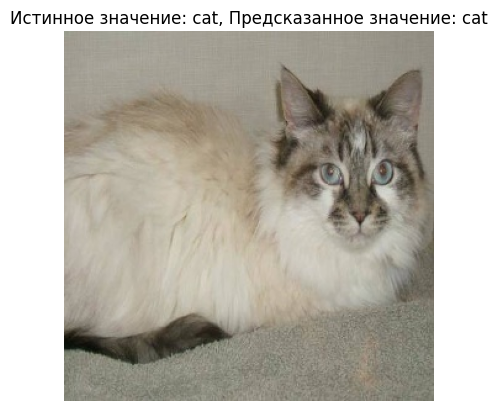

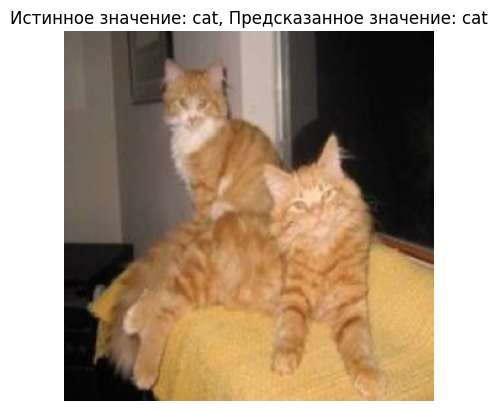

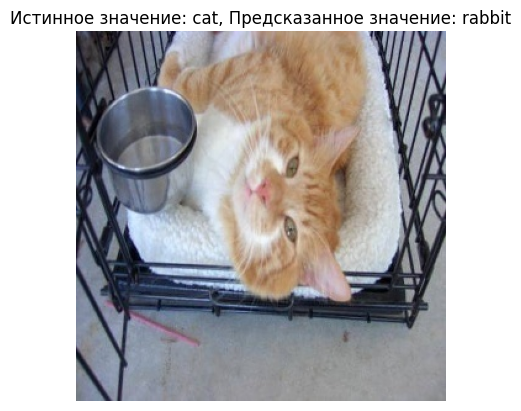

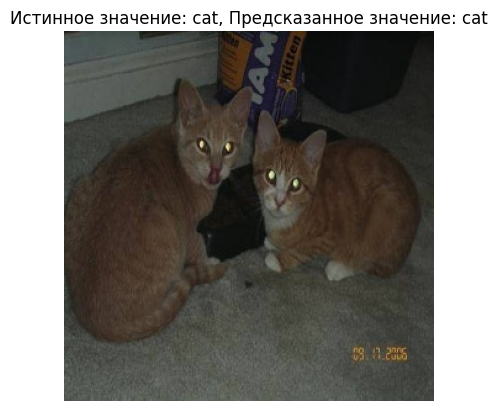

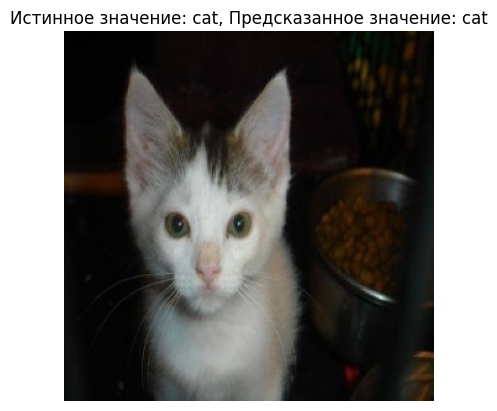

...

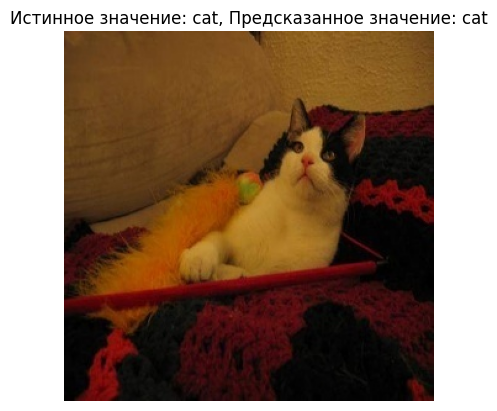

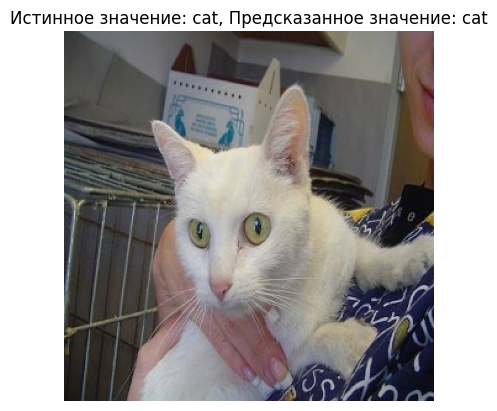

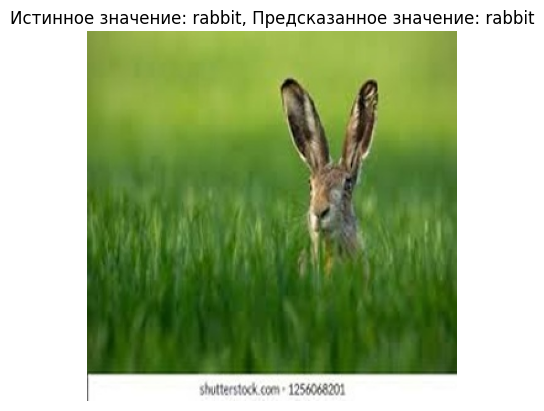

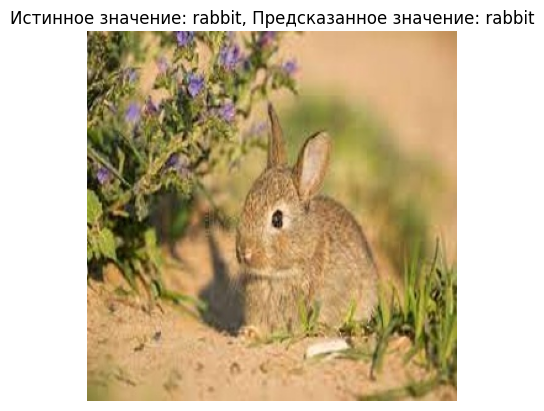

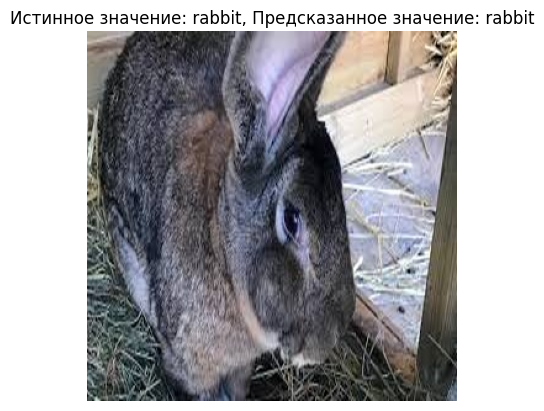

In [40]:
val_results = model.evaluate(X_val, y_val)
print("Validation Loss:", val_results[0])
print("Validation Accuracy:", val_results[1])

# Прогнозирование на валидационной выборке
y_val_pred = model.predict(X_val)

# Преобразование прогнозируемых вероятностей в прогнозируемые метки классов
y_val_pred_classes = np.argmax(y_val_pred, axis=1)

# Сопоставление меток классов с соответствующими именами классов
class_names = {0: 'cat', 1: 'rabbit'}

# Отображение результатов для каждого изображения в наборе проверки
for i in range(len(X_val)):
    img_path = df_images_val['cats'][i] if y_val[i] == 0 else df_images_val['rabbits'][i]
    img = Image.open(str(img_path))
    true_label = class_names[y_val[i]]
    pred_label = class_names[y_val_pred_classes[i]]

    plt.imshow(img)
    plt.title(f"Истинное значение: {true_label}, Предсказанное значение: {pred_label}")
    plt.axis('off')
    plt.show()


In [36]:
from google.colab import files

import matplotlib.pyplot as plt

# Функция для загрузки и предобработки изображений с компьютера
def load_user_images():
    uploaded = files.upload()
    user_images = []

    for file_name in uploaded.keys():
        user_img = cv2.imread(file_name)

        # Преобразование изображения в нужный тип данных (CV_8U)
        user_img = user_img.astype(np.uint8)

        resized_user_img = cv2.resize(user_img, (224, 224))
        user_img_array = np.expand_dims(resized_user_img, axis=0) / 255.0
        user_images.append((user_img_array, resized_user_img))

    return user_images

user_images = load_user_images()

Saving cat.1.jpg to cat.1 (3).jpg
Saving cat.2.jpg to cat.2 (2).jpg
Saving cat.3.jpg to cat.3 (2).jpg
Saving cat.4.jpg to cat.4 (2).jpg
Saving cat.5.jpg to cat.5 (2).jpg


1/1 [==============================] - 0s 58ms/step

Класс выбранной картинки: cat


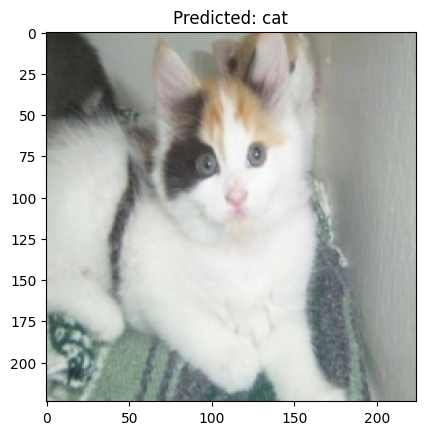

1/1 [==============================] - 0s 99ms/step

Класс выбранной картинки: cat


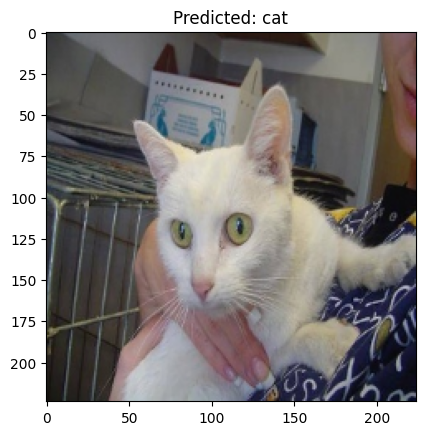

1/1 [==============================] - 0s 49ms/step

Класс выбранной картинки: cat


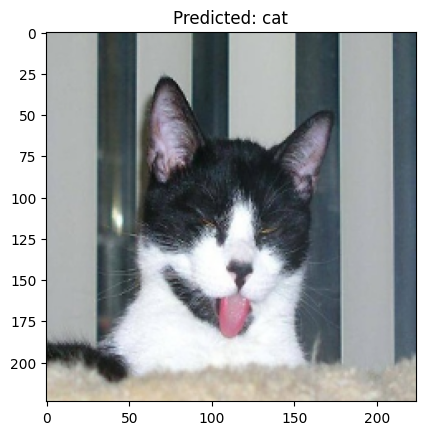

1/1 [==============================] - 0s 51ms/step

Класс выбранной картинки: cat


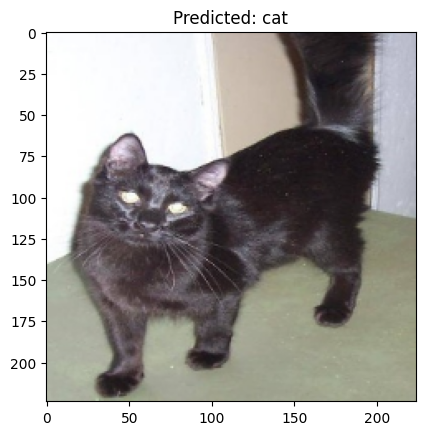

1/1 [==============================] - 0s 53ms/step

Класс выбранной картинки: cat


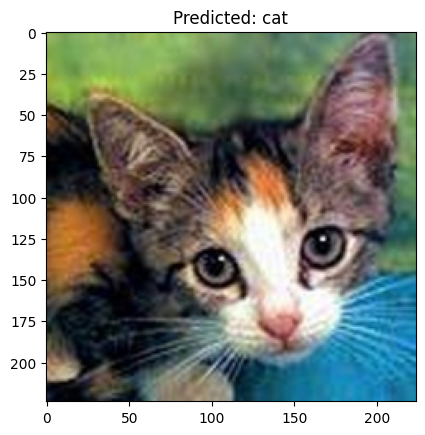

In [37]:
# Предсказываем классы изображений используя обученную модель
for user_img_array, resized_user_img in user_images:
    predictions = model.predict(user_img_array)
    predicted_class = np.argmax(predictions)

    # Отображение результата (определение класса)
    class_labels = {0: 'cat', 1: 'rabbit'}
    result_label = class_labels[predicted_class]
    print(f"\nКласс выбранной картинки: {result_label}")

    # Отображение изображения
    plt.imshow(cv2.cvtColor(resized_user_img, cv2.COLOR_BGR2RGB))
    plt.title(f"Предсказанный класс: {result_label}")
    plt.show()

##**Визуализация изменения точности и функции потерь**

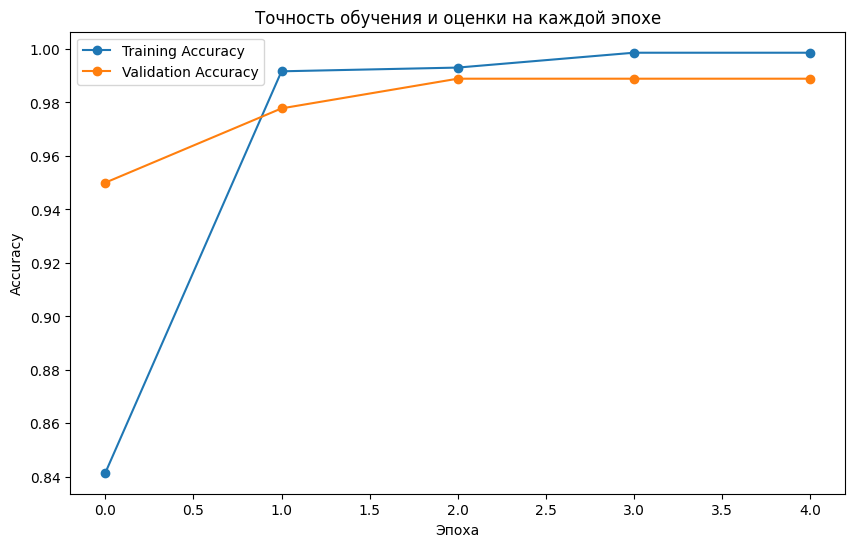

In [20]:
# Преобразование "истории" обучения в DataFrame
acc = pd.DataFrame({'train': history.history['accuracy'], 'val': history.history['val_accuracy']})

# Создаём линейный график
plt.figure(figsize=(10, 6))

# График изменения метрики accuracy тренировочного набора
plt.plot(acc.index, acc['train'], label='Training Accuracy', marker='o')

# График изменения метрики accuracy валидационного набора
plt.plot(acc.index, acc['val'], label='Validation Accuracy', marker='o')

plt.title('Точность обучения и оценки на каждой эпохе')
plt.xlabel('Эпоха')
plt.ylabel('Accuracy')

plt.legend()

plt.show()

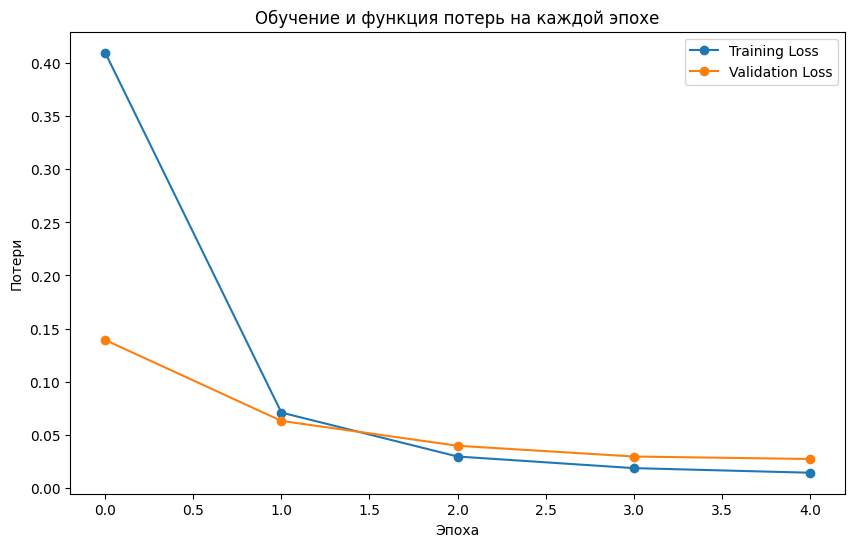

In [21]:
loss = pd.DataFrame({'train': history.history['loss'], 'val': history.history['val_loss']})

plt.figure(figsize=(10, 6))

plt.plot(loss.index, loss['train'], label='Training Loss', marker='o')

plt.plot(loss.index, loss['val'], label='Validation Loss', marker='o')

plt.title('Обучение и функция потерь на каждой эпохе')
plt.xlabel('Эпоха')
plt.ylabel('Потери')

plt.legend()

plt.show()